<a href="https://colab.research.google.com/github/oceam/agri-image/blob/main/Lecture_3_Calculate_Plant_Coverage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Please download required materials from: https://drive.google.com/drive/folders/125GR89DZeVSp5KV1kDF5vlM8m6XERdif?usp=sharing

# Hidden Codes

All the codes used in this course are hidden here, you can use `course.xxxx()` to run some functions

In [1]:
# import packages
from google.colab import files

import os
from tqdm.auto import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage.io import imread

In [16]:
from skimage.filters import threshold_otsu
from skimage import morphology

import time
import sys
from matplotlib.colors import ListedColormap
import seaborn as sns

from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from skimage import io, color

class Course:

    def __init__(self):
        pass

    ##################
    # 3 index values #
    ##################
    @staticmethod
    def ExG(img_np):
        img = img_np.astype(np.float32)
        R = img[:, :, 0]
        G = img[:, :, 1]
        B = img[:, :, 2]
        
        return 2 * G - R - B

    @staticmethod
    def ExR(img_np):
        img = img_np.astype(np.float32)
        R = img[:, :, 0]
        G = img[:, :, 1]
        B = img[:, :, 2]
        
        return 1.4 * R - G

    @staticmethod
    def NDI(img_np):
        img = img_np.astype(np.float32)
        R = img[:, :, 0]
        G = img[:, :, 1]
        B = img[:, :, 2]
        
        return (G - R) / (G + R + 0.0000000001)  # solve G=0 and R=0


    #########################
    # Otsu Threshold method #
    #########################
    @staticmethod
    def otsu(image):
        thresh = threshold_otsu(image)
        return image > thresh

    ######################
    # Calculate coverage #
    ######################
    @staticmethod
    def coverage(binary_img):
        h, w = binary_img.shape
        total = h * w
        
        true_num = np.sum(binary_img==True)
        
        return true_num / total

    @staticmethod
    def plant_index_otsu(img_list, figsize=None, dpi=300):
        img_num = len(img_list)
        if figsize is None:
            figsize = (4*img_num, 9)
        fig, ax = plt.subplots(3, img_num, figsize=figsize, dpi=300)

        if img_num == 1:
            ax = ax.reshape(3, 1)

        for i, test_img in enumerate(img_list):
            exg1 = course.ExG(test_img)
            exr1 = course.ExR(test_img)

            ex_GR1 = exg1 - exr1

            exg1_otsu = course.otsu(exg1)

            binary_GR1 = ex_GR1 > 0


            ax[0,i].set_title(f"Image {i+1}")

            ax[0,i].imshow(test_img)
            ax[0,i].set_xticks([])
            ax[0,i].set_yticks([])
            ax[0,i].set_xticklabels([])
            ax[0,i].set_yticklabels([])

            ax[1,i].set_title(f"{round(course.coverage(exg1_otsu)*100, 2)}%")
            ax[1,i].imshow(exg1_otsu, cmap="gray")
            ax[1,i].set_xticks([])
            ax[1,i].set_yticks([])
            ax[1,i].set_xticklabels([])
            ax[1,i].set_yticklabels([])
            ax[1,i].set_xlabel(f"ExG + Otsu")

            ax[2,i].set_title(f"{round(course.coverage(binary_GR1)*100, 2)}%")
            ax[2,i].imshow(binary_GR1, cmap="gray")
            ax[2,i].set_xlabel(f"ExG-ExR>0")
            ax[2,i].set_xticks([])
            ax[2,i].set_yticks([])
            ax[2,i].set_xticklabels([])
            ax[2,i].set_yticklabels([])

        plt.show()


    ########################
    # Supervised ML by CSV #
    ########################
    @staticmethod
    def expand_colorspace(img):
        # img is the ndarray from io.imread()
        (h, w, dimen) = img.shape
        
        if dimen == 4: # exist alpha layer (RGBA)
            img = img[:,:, 0:3]
            dimen = 3
            
        rgb = img.reshape(h * w, dimen)
        lab = color.rgb2lab(img).reshape(h * w, dimen)
        hsv = color.rgb2hsv(img).reshape(h * w, dimen)
        
        exp_img = np.concatenate((rgb, lab, hsv), axis=1)
        
        return exp_img
   
    @staticmethod
    def training_data_generate(img_list, kind_list):
        # example：
        # img_list = [io.imread(), io.imread(), io.imread()], element is ndarray
        # king_list = [0, 1, 2]
        train_data = np.empty((0, 9))
        train_kind = np.empty((0,))
        for img, kind in zip(img_list, kind_list):
            (h, w, dimen) = img.shape
            exp_img = expand_colorspace(img)
            
            if dimen == 4:
                img_reshape = img.reshape(h * w, dimen)
                train_index = np.nonzero(img_reshape[:, 3])  # the index of alpha layer not zero pixels
                exp_img = exp_img[train_index]  # pick the pixels that not background
            
            print(f"|--- Convert kind [{kind}] to training data, converted shape is {str(exp_img.shape)}")
            kinds = np.array([kind] * exp_img.shape[0]) 

            # merge each train_data and kind
            train_data = np.vstack((train_data, exp_img))
            train_kind = np.hstack((train_kind, kinds))

        return train_data, train_kind  
        
    @staticmethod
    def training_data_from_easypcc_csv(csv_path, crop_name='Crop'):
        csv_data = pd.read_csv(csv_path)
        px_num = len(csv_data)
        
        # convert R G B vertical list to skimage.color.pixels
        csv_rgb = np.stack([csv_data[['R']], csv_data[['G']], csv_data[['B']]], axis=2)
        # convert in python way, incase JS not get same results
        lab = color.rgb2lab(csv_rgb).reshape(px_num, 3)
        hsv = color.rgb2hsv(csv_rgb).reshape(px_num, 3)
        # merge to list
        train_data = np.concatenate((csv_data[['R', 'G', 'B']], lab, hsv), axis=1)
        
        train_kind = np.zeros((px_num, 1))
        train_kind[csv_data['Class'] == crop_name, :] = 1
        
        return train_data, train_kind

    @staticmethod   
    def train_model(train_data, train_kind, classifier="CART"):
        # classifier = ["CART", "SVM", "RF"]
        t0 = time.time()
        if classifier == "CART":
            clf = DecisionTreeClassifier(max_depth=20)
        elif classifier == "SVM":
            clf = LinearSVC()
        elif classifier == "RF":
            clf = RandomForestClassifier()
        elif classifier == "GDBT":
            clf = GradientBoostingClassifier()
            
        clf = clf.fit(train_data, train_kind)
        t1 = time.time()
        
        print(f'|-- Training model time cost={int(t1-t0)}s')
        return clf

    def predict_model(self, clf_img, model):
        (h, w, dimen) = clf_img.shape
        exp_clf_img = self.expand_colorspace(clf_img)
        pred_result = model.predict(exp_clf_img).reshape(h, w)
        return pred_result
 
    def apply_model(self, clf_img, model):
        t0 = time.time()
        (h, w, dimen) = clf_img.shape
        if h * w >= 1600 * 1600:  # slice picture to save RAM
            slice_num = np.ceil(w * h / (1600 * 1600)).astype(np.int32)
            break_points = np.linspace(0, h, num=slice_num).astype(np.int32)
            line_st = break_points[:-1]
            line_ed = break_points[1:]
        else:
            line_st = [0]
            line_ed = [h]
        
        pred_result = np.empty((0, w))
        i = 0
        for st, ed in zip(line_st, line_ed):
            clf_result = self.predict_model(clf_img[st:ed, :], model)
            pred_result = np.vstack((pred_result, clf_result))
            
            percent = round((i+1) / len(line_st) * 100, 2)
            print('\r|' + '='*round(percent/2) + '>'+ ' '*round(50-percent/2) + '|' + str(percent) + '%', end="")
            i += 1
        t1 = time.time()
        print(f'| Cost={int(t1-t0)}s')
        return pred_result

    @staticmethod
    def save_result(pred_result, img_save_name, color_list):
        color_list = np.array(color_list)/255
        cmap_cf = ListedColormap(color_list, name='colorfriendly')
        plt.imsave(img_save_name, pred_result, cmap=cmap_cf)

    @staticmethod
    def denoise(image, min_obj_size=100, area_thresh=25):
        cleaned1 = morphology.remove_small_objects(image==1, min_size=min_obj_size)
        cleaned1 = morphology.remove_small_holes(cleaned1, area_threshold=area_thresh)

        return cleaned1

    ###############
    # SML wrapper #
    ###############
    def supervise_machine_learning(self, uav_image, uav_train, denoise="default", save=None):
        test1 = imread(uav_image)
        train_data, train_kind = self.training_data_from_easypcc_csv(uav_train)
        model = self.train_model(train_data, train_kind, classifier="CART")
        result = self.apply_model(test1, model)
        if denoise == "default":
            result_clean = self.denoise(result)
        else:
            result_clean = self.denoise(result, denoise[0], denoise[1])

        fig, ax = plt.subplots(1, 3, figsize=(6,9), dpi=300)
        ax[0].imshow(test1)
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_xticklabels([])
        ax[0].set_yticklabels([])
        ax[0].set_xlabel("Original Image")

        ax[1].set_title(f"{round(self.coverage(result)*100, 2)}%")
        ax[1].imshow(result, cmap="gray")
        ax[1].set_xticks([])
        ax[1].set_yticks([])
        ax[1].set_xticklabels([])
        ax[1].set_yticklabels([])
        ax[1].set_xlabel("Classified by ML")

        ax[2].set_title(f"{round(self.coverage(result_clean)*100, 2)}%")
        ax[2].imshow(result_clean, cmap="gray")
        ax[2].set_xticks([])
        ax[2].set_yticks([])
        ax[2].set_xticklabels([])
        ax[2].set_yticklabels([])
        ax[2].set_xlabel("Denoised")
        if save is not None:
            os.makedirs(save, exist_ok=True)
            plt.tight_layout()
            plt.savefig(f"{save}/result_{uav_image.split('/')[-1]}")
            plt.close()
        else:
            plt.show()
        
        return round(self.coverage(result)*100, 2), round(self.coverage(result_clean)*100, 2)
        

course = Course()

# Section 0: Data Preparation

Please upload the `example.zip` into colab by using the following code:



In [3]:
# download file from google drive
!gdown --id 1zJ2_gi2UMcbdl2F3adZcaBID6QkMwX5R

Downloading...
From: https://drive.google.com/uc?id=1zJ2_gi2UMcbdl2F3adZcaBID6QkMwX5R
To: /content/example.zip
39.6MB [00:00, 70.0MB/s]


Then unzip that example data by:

In [4]:
!unzip example.zip  # change the example.zip to any other zip file

Archive:  example.zip
   creating: broccoli/
  inflating: broccoli/200318_11_DJI_0817.csv  
  inflating: broccoli/200318_11_DJI_0817.JPG  
  inflating: broccoli/200326_11_DJI_0263.csv  
  inflating: broccoli/200326_11_DJI_0263.JPG  
  inflating: broccoli/200327_11_DJI_0712.csv  
  inflating: broccoli/200327_11_DJI_0712.JPG  
  inflating: broccoli/200331_11_DJI_0163.csv  
  inflating: broccoli/200331_11_DJI_0163.JPG  
  inflating: broccoli/200406_11_DJI_0676.csv  
  inflating: broccoli/200406_11_DJI_0676.JPG  
  inflating: broccoli/200415_11_DJI_0464.csv  
  inflating: broccoli/200415_11_DJI_0464.JPG  
  inflating: broccoli/200417_11_DJI_0541.csv  
  inflating: broccoli/200417_11_DJI_0541.JPG  
  inflating: broccoli/200421_11_DJI_0402.csv  
  inflating: broccoli/200421_11_DJI_0402.JPG  
  inflating: broccoli/200422_11_DJI_0206.csv  
  inflating: broccoli/200422_11_DJI_0206.JPG  
  inflating: broccoli/200427_11_DJI_0654.csv  
  inflating: broccoli/200427_11_DJI_0654.JPG  
  inflating: br

Here is the all images used in this course (UAV flight at 15m)

![](https://img.sigmameow.com/picgo/colab_20210629143426.png)

# Section 1: Background

How to estimate plant coverage from images

Images are consisted by large amount of pixels:

![](https://img.sigmameow.com/picgo/colab_20210629163507.gif)

If we can judge each pixel whether a plant pixel or soil pixel

$$ \frac{\text{number of plants}}{\text{number of all pixels}} = \frac{\text{plant area}}{\text{full area}} = \text{plant coverage}$$

### How can we judge pixel classes?

One way is judge one by one manually (Paint to different pure colors for easier identify).

![](https://img.sigmameow.com/picgo/colab_20210629164607.gif)


It is a necessary step when prepare "ground truth" for computer vision experiments

---

But previous is very tedious, do we have any automatic way?

The answer is true, because in computer, the colors is actually a group of numbers

![](https://img.sigmameow.com/picgo/colab_20210629164956.png)

We can use three-primary colours (red, green, and blue) and its intensity to represent all kinds of visuable colors.

For example, we have a image like this:


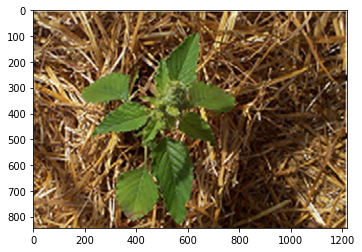

In [5]:
# read images into code
paper = imread('imgs/paper.png')
paper = paper[:, :, 0:3]

# display image
plt.imshow(paper)

what is actually saved in the computer?

In [6]:
paper.shape

(844, 1218, 3)

The `.shape` tells the size of this image, it is 844 pixel height, 1218 pixel width, and 3 channels with RGB.

Here is the code to check the values of the left upper corner pixel:

In [7]:
paper[0,0,:]

array([255, 255, 254], dtype=uint8)

It means, Red=255, Green=255, and Blue=254.

# Section 2: Classify by simple values

### Classify by a single color channel

In the following figure, we can see the leaves are green and background are yellow



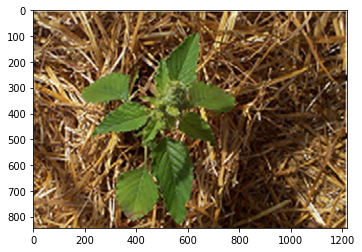

In [ ]:
plt.imshow(paper)

And according to this color table, we can see the yellow color both have very high R & G values, but the green color have low R and hight G values.

![](https://img.sigmameow.com/picgo/colab_20210629171807.png)

So we can define a threshold, to say all R values < 100 are green leaves, otherwise is background

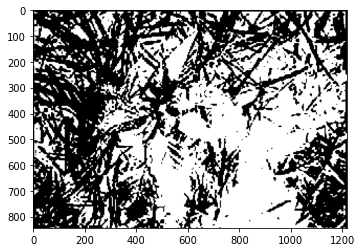

In [ ]:
# paper[:,:,0] choose all height, and all width, and only the first layer in color channel
plt.imshow(paper[:,:,0] < 100, cmap="gray")

The white color indicate the pixels R values < 100.

But it seems bad result.

Because the color interactions are very complecated, using simple green channel can not distinuish very well.

### Classify by color index values

In the paper of "Verification of color vegetation indices for automated crop imaging applications
", Meyer proposed three index calculated from RGB values: `NDI`, `ExG`, and `ExR`

![](https://img.sigmameow.com/picgo/colab_20210629173055.png)

By using three values, it strength the differences between leaves and backgrounds.

Meanwhile, instead of manual given a value (e.g. 100 in previous cases, it used an automatic method: Otsu Threshold)

<p><a href="https://commons.wikimedia.org/wiki/File:Otsu%27s_Method_Visualization.gif#/media/File:Otsu's_Method_Visualization.gif"><img src="https://upload.wikimedia.org/wikipedia/commons/3/34/Otsu%27s_Method_Visualization.gif" alt="Otsu's Method Visualization.gif"></a></p>

Let us recurrent this experiment:


**Show the strength results like paper**


In [ ]:
exg_p = course.ExG(paper)
exr_p = course.ExR(paper)
ndi_p = course.NDI(paper)

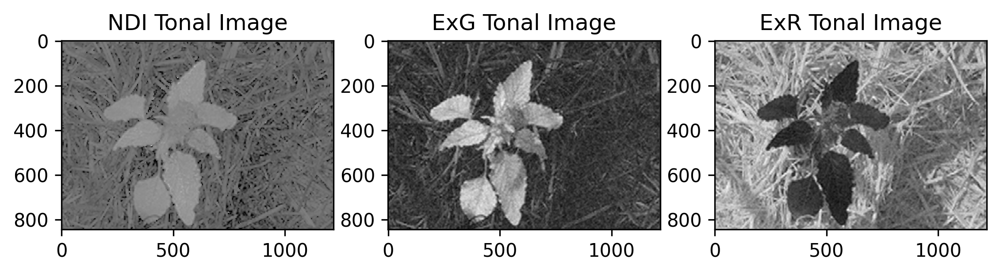

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3), dpi=300)

ax[0].set_title("NDI Tonal Image")
ax[0].imshow(ndi_p, cmap="gray")

ax[1].set_title("ExG Tonal Image")
ax[1].imshow(exg_p, cmap="gray")

ax[2].set_title("ExR Tonal Image")
ax[2].imshow(exr_p, cmap="gray")

plt.show()

**Change to a blank and white 2 class figure**

In [ ]:
ndi_p_otsu = course.otsu(ndi_p)
exg_p_otsu = course.otsu(exg_p)

ExG_ExR_p = exg_p - exr_p
binary_GR_p = ExG_ExR_p > 0

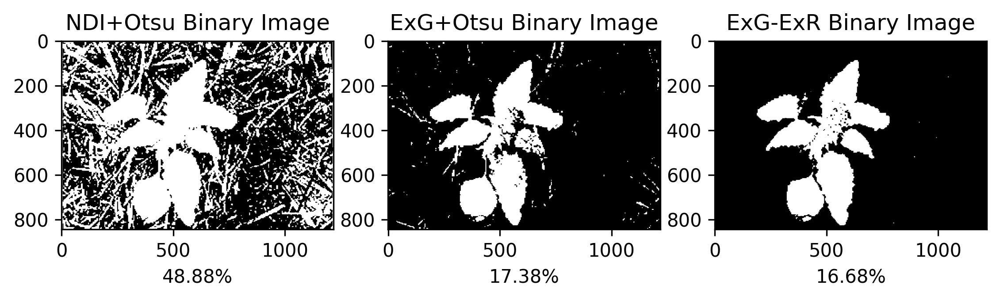

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3), dpi=300)

ax[0].set_title("NDI+Otsu Binary Image")
ax[0].imshow(ndi_p_otsu, cmap="gray")
ax[0].set_xlabel(f"{round(course.coverage(ndi_p_otsu)*100, 2)}%")

ax[1].set_title("ExG+Otsu Binary Image")
ax[1].imshow(exg_p_otsu, cmap="gray")
ax[1].set_xlabel(f"{round(course.coverage(exg_p_otsu)*100, 2)}%")

ax[2].set_title("ExG-ExR Binary Image")
ax[2].imshow(binary_GR_p, cmap="gray")
ax[2].set_xlabel(f"{round(course.coverage(binary_GR_p)*100, 2)}%")

plt.show()

### Practice on simple paddy practices

Here we have two paddy images

In [8]:
# read paddy data
test1 = imread('imgs/test1.jpg')
test2 = imread('imgs/test2.jpg')

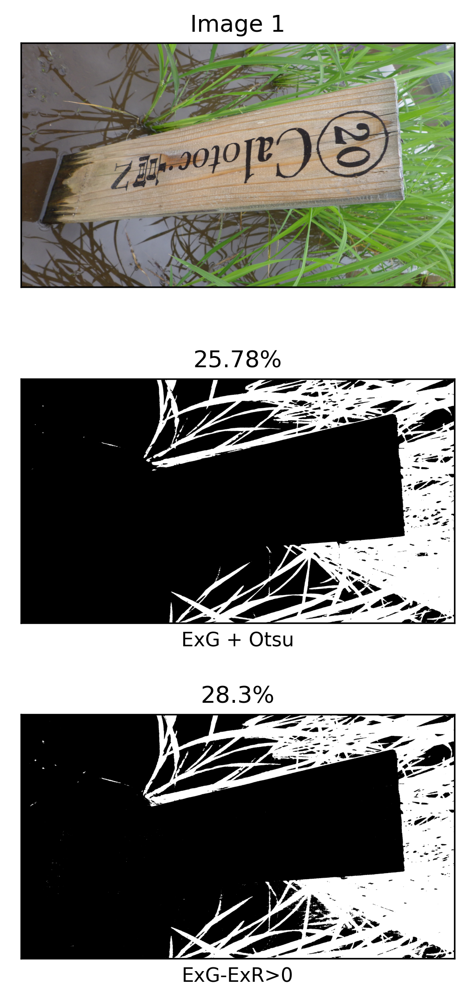

In [9]:
course.plant_index_otsu([test1])

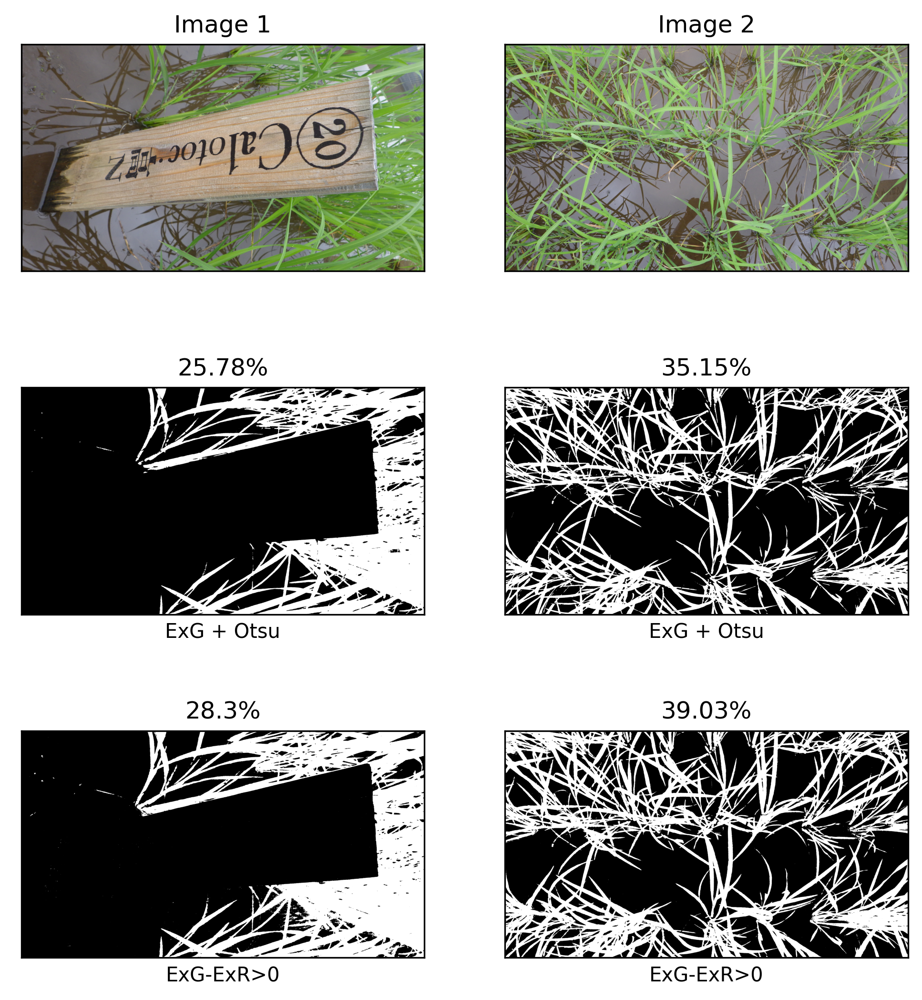

In [ ]:
course.plant_index_otsu([test1, test2])

### Test your own UAV data!

Please use the following code, upload two UAV images into Colab:

In [ ]:
uploaded = files.upload()

Then change the file name in the follwoing code by two images just uploaded:

In [ ]:
your_uav1 = imread('your_uav_image1.jpg')   # <- change the string here for image one
your_uav2 = imread('your_uav_image2.jpg')   # <- change the string here for image two

Run the follwoing code to see the results!

In [ ]:
course.plant_index_otsu([your_uav1, your_uav2])

How is your results look like? Do they performs perfectly?

Don't worry if your results are not perfect, we have solutions for dealing with some complex images.

### Problems when dealing with complex background

Let us test on our broccoli data

In [ ]:
broccoli1 = imread("broccoli/200406_11_DJI_0676.JPG")
broccoli2 = imread("broccoli/200422_11_DJI_0206.JPG")
broccoli3 = imread("broccoli/200508_11_DJI_0400.JPG")

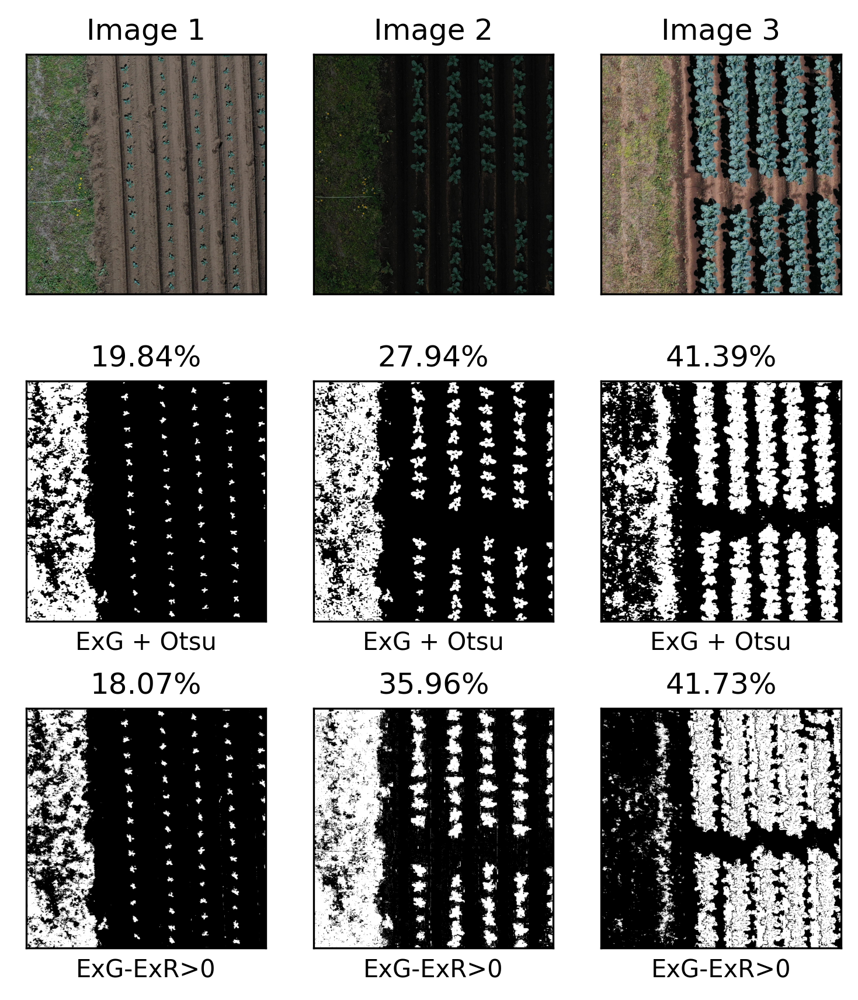

In [ ]:
course.plant_index_otsu([broccoli1, broccoli2, broccoli3], figsize=(6,7))

The broccli part seems acceptable, but the some weeds are also distingushed as the plant part, what if we do not want those weeds be counted in?

# Section 3: Classify by supervised machine learning

The supervised machine learning means

Human prepare the some examples to machine, the machine itself will try to learn the regulation behind the examples that you give.

Here is the main steps for classifying images:

1. Manual draw some parts of foreground (plants) and backgrounds (sold and weeds)    
    *Use `collectTrainJS_v2` tool in the folder* 
1. Use those data to train models
1. Apply the trained models to images
1. Denoise
1. Calculate the coverage


### Step 1: Draw training data (examples for machine) by `collectTrainJS_v2`

* Open `index.html` and drag images into browser.

* left mouse to move, scroll to zoom, and right mouse to draw.

* Switch foregrounda nd background in upper part

* Click save to export traning data as csv file

Draw foreground:

| example 1 | example 2|
| ---       |  ---     |
| <img src="https://img.sigmameow.com/picgo/colab_20210629144543.png" height="500"/> | <img src="https://img.sigmameow.com/picgo/colab_20210629155919.png" height="500" />|

Draw backgorund:

| example 1 | example 2|
| ---       |  ---     |
| <img src="https://img.sigmameow.com/picgo/colab_20210629144750.png" height="500"/> | <img src="https://img.sigmameow.com/picgo/colab_20210629160247.png" height="500"/> |


After drawing training data, useing the following code to upload into Colab

In [ ]:
uploaded = files.upload()

### Step 1.5: Load csv data into Colab

In [ ]:
train_csv = "broccoli/200422_11_DJI_0206.csv"

In [ ]:
train_data, train_kind = course.training_data_from_easypcc_csv(train_csv)

### Step 2: train model

In [ ]:
model = course.train_model(train_data, train_kind, classifier="CART")

|-- Training model time cost=0s


### Step 3: apply model

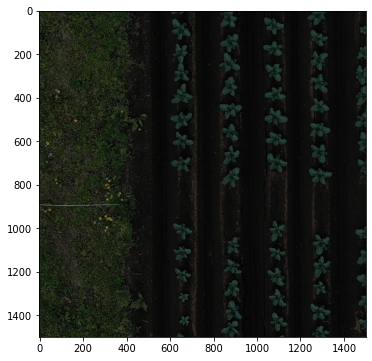

In [ ]:
test1 = imread('broccoli/200422_11_DJI_0206.JPG')
plt.figure(figsize = (6,6))
plt.imshow(test1)

|==================================================>|100.0%| Cost=1s


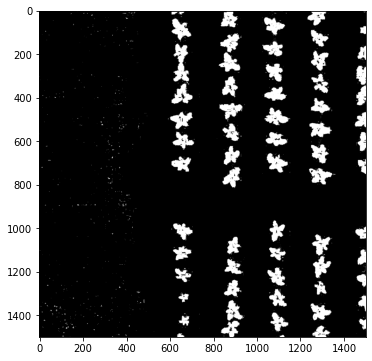

In [ ]:
result = course.apply_model(test1, model)
plt.figure(figsize = (6,6))
plt.imshow(result, cmap="gray")

### Step 4: denoise

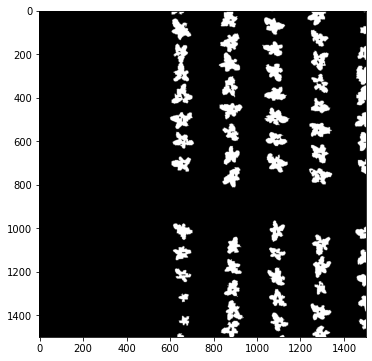

In [ ]:
result_clean = course.denoise(result)
plt.figure(figsize = (6,6))
plt.imshow(result_clean, cmap="gray")

### Step 4: calculate the coverage

In [ ]:
course.coverage(result)

0.09006266666666667

In [ ]:
course.coverage(result_clean)

0.08846044444444444

### Step 5: merged together


|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s


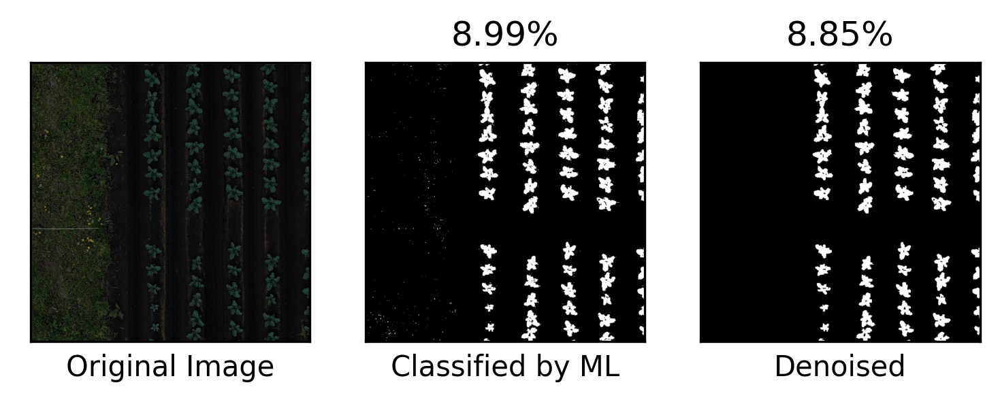

In [ ]:
course.supervise_machine_learning('broccoli/200422_11_DJI_0206.JPG', "broccoli/200422_11_DJI_0206.csv", denoise="default")

### Try your own UAV image

First, upload your own training data

In [ ]:
uploaded = files.upload()

In [ ]:
uav_image = "path/your_uav_image.jpg"
uav_train = "path/your_uav_train.csv"

In [ ]:
course.supervise_machine_learning(uav_image, uav_train)

# Section 4: Broccoli coverage tracking through growth

Retrieve target images and their corresponding annotations, and sort them by the UAV flight date


**Important**

Please rename all the images in the given folder like:

* 200318_xxxx.JPG
* 200345_xxxx.JPG

In [10]:
folder_name = "broccoli"
img_suffix = ".JPG"
save_path = "'broccoli_results"

In [17]:
entry_list = [entry for entry in os.scandir(folder_name) if entry.name.endswith(img_suffix)]
# sort list by flight date
entry_list = sorted(entry_list,key=lambda x:x.name.split('_')[0])

converages = []
clean_converages = []
for entry in tqdm(entry_list, total=len(entry_list)):
    uav_image = entry.path
    uav_train = entry.path.replace('.JPG', '.csv')
    converage, clean_converage = course.supervise_machine_learning(uav_image, uav_train, save=save_path)
    converages.append(converage)
    clean_converages.append(clean_converage)

# save to csv fle
df = {'img_name': [entry.name for entry in entry_list], 'img_path': [entry.path for entry in entry_list], 'result_path':[f'{save_path}/result_{entry.name}' for entry in entry_list], 'converages': converages, 'clean_converages': clean_converages}
df = pd.DataFrame(df)
df.to_csv(f'{save_path}/results.csv')

|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%| Cost=1s
|-- Training model time cost=0s
|==================================================>|100.0%

Visuazlizing broccoli coverage tracking through growth

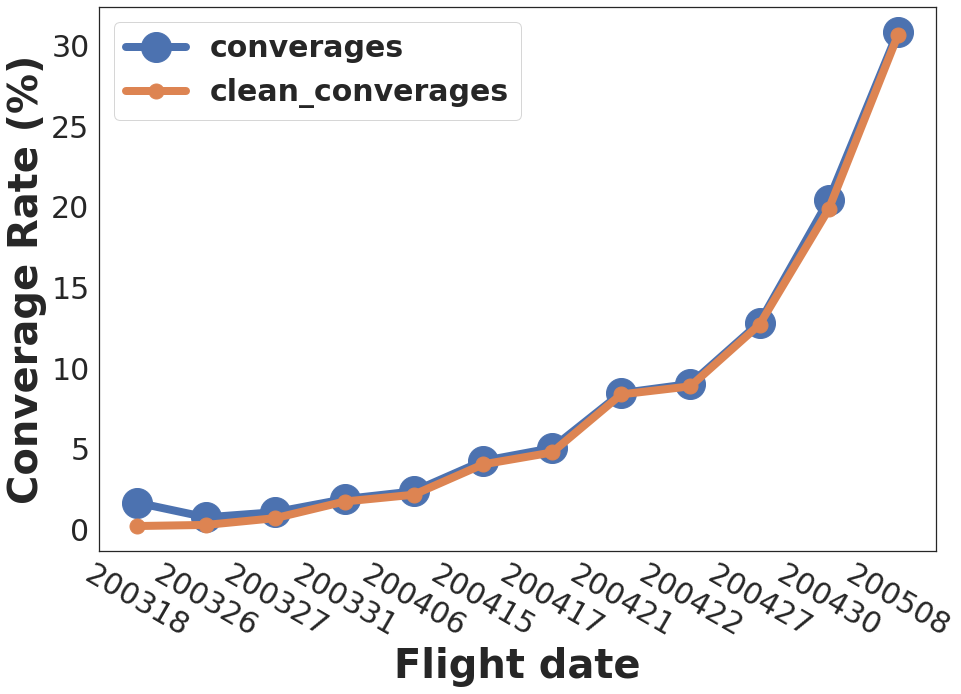

In [14]:
legendict={'size': 30, 'weight':'bold'}
label_font = {'size': 40, 'weight':'bold'}
linewidth = 8
markersize = 30
size = 30

sns.set_theme(style="white")
palette = sns.color_palette()

fig = plt.figure(figsize=(15,10))

ax = fig.add_subplot(111)

x = np.arange(len(entry_list))
labels = [entry.name.split('_')[0] for entry in entry_list]

ax.plot(x, converages, marker='o', label='converages', linewidth=linewidth,markersize=markersize, color=palette[0])
ax.plot(x, clean_converages, marker='.', label='clean_converages', linewidth=linewidth,markersize=markersize, color=palette[1])

plt.xticks(x, labels=labels, size=size, rotation=-30)
plt.yticks(size=size)
plt.xlabel("Flight date", fontdict=label_font)
plt.ylabel("Converage Rate (%)", fontdict=label_font)
plt.legend(prop=legendict)
plt.show()